<a href="https://colab.research.google.com/github/LyanhVini/Similarity-Algorithm-for-Data-Annotation/blob/main/similaridade_VGG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
import os
import numpy as np
import zipfile
import torch
import pickle
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from torchvision import datasets, models, transforms
from PIL import Image

Setar a GPU

In [ ]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("CUDA está disponível. Dispositivo configurado para GPU.")
else:
    device = torch.device("cpu")
    print("CUDA não está disponível. Usando CPU.")

CUDA está disponível. Dispositivo configurado para GPU.


In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Extraindo os dados

In [ ]:
file_imageNet = '/content/drive/MyDrive/Pesquisas e Projetos/Algoritmo de Similaridade - Inteceleri/random images.zip'
file_solidosv1 = '/content/drive/MyDrive/Pesquisas e Projetos/Algoritmo de Similaridade - Inteceleri/train_solidosv1.zip'

In [ ]:
diretorio_destino = '/content/'
# Descompactar o arquivo zip
with zipfile.ZipFile(file_imageNet, 'r') as zip_ref:
    zip_ref.extractall(diretorio_destino)
with zipfile.ZipFile(file_solidosv1, 'r') as zip_ref:
    zip_ref.extractall(diretorio_destino)

###Capturando os Embeddings com o VGG-16

Carregando modelo pré treinado

In [ ]:
model = models.vgg16(pretrained=True)
model.to(device)
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:04<00:00, 121MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# Definir as transformações necessárias
transform = transforms.Compose([
    transforms.Resize(256),
    #transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Funções para Capturar os embeddings com o VGG-16

{
path:"...",
dataset:"...",
vgg_feature:[...]
}


dataset_final = [dict1, dict2, ..., dictN]

In [ ]:
import torch.nn as nn

def get_image_embedding(image_path, model, dataset, transform):
    embeddings = []
    device = next(model.parameters()).device  # Obter o dispositivo do modelo
    for image in os.listdir(image_path):
        if image.lower().endswith(('.png', '.jpg', '.jpeg')):
            img_path = os.path.join(image_path, image)
            img = Image.open(img_path)
            img_t = transform(img)
            img_t = img_t.to(device)  # Mover o tensor para o dispositivo do modelo
            batch_t = torch.unsqueeze(img_t, 0)
            # Desabilita o cálculo de gradiente para economizar memória e aumentar a velocidade
            with torch.no_grad():
                # Se for o modelo VGG-16, extraímos o embedding
                if isinstance(model, torch.nn.Module) and hasattr(model, 'features'):
                    vgg_features = model.features(batch_t)
                else:
                    raise TypeError("O modelo fornecido não é uma instância válida do VGG-16")

                embeddings.append({
                    "path": img_path,
                    "dataset": dataset,
                    "vgg_feature": vgg_features#.cpu().numpy().tolist()
                })

    return embeddings


Embeddings para as 50 imagens aletórias do dataset desconhecido (imageNet)

In [ ]:
image_path = '/content/random images/'
embeddings_imagenet = get_image_embedding(image_path, model, 'imagenet', transform)
#print(embeddings_imagenet)

In [ ]:
embeddings_imagenet[1]

{'path': '/content/random images/Cópia de 9853790580855613.jpg',
 'dataset': 'imagenet',
 'vgg_feature': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.4507, 0.0000, 0.7714,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 1.0534, 0.2666,  ..., 0.0000, 0.0000, 0.4433],
           [0.0000, 0.1453, 0.5118,  ..., 0.0000, 0.2174, 0.9954],
           [0.0000, 0.0000, 0.2903,  ..., 0.0000, 0.0000, 1.2019]],
 
          [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.4384, 0.0824,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.2583, 0.9478,  ..., 0.0821, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.5590,  ..., 0.0000, 0.0000, 0.0000]],
 
          [[0.1402, 0.6654, 1.0704,  ..., 0.0000, 0.00

In [ ]:
len(embeddings_imagenet)

505

In [ ]:
type(embeddings_imagenet)

list

In [ ]:
# Salvar a lista em um arquivo usando pickle
#with open('embeddings.pkl', 'wb') as f:
#    pickle.dump(embeddings_imagenet, f)

In [ ]:
#with open('embeddings.pkl', 'rb') as f:
#    dictionary_loader01 = pickle.load(f)

Embeddings das imagens em cada uma das classe do dataset conhecido (solidosv1)

In [ ]:
image_path = '/content/train/Esfera'
embeddings_solidosv1_cilindro = get_image_embedding(image_path, model, 'solidosv1', transform)
#print(embeddings_imagenet)

In [ ]:
embeddings_solidosv1_cilindro[0]

{'path': '/content/train/Esfera/00f4d774a2244f1.png',
 'dataset': 'solidosv1',
 'vgg_feature': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.9714, 0.7664,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.3891, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 2.6450, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
          [[0.0000, 0.0000, 0.0000,  ..., 0.5832, 0.8484, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.8239, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.2666, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
          [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000

In [ ]:
len(embeddings_solidosv1_cilindro)

396

In [ ]:
type(embeddings_solidosv1_cilindro[0])

dict

In [ ]:
dataset_final = embeddings_solidosv1_cilindro + embeddings_imagenet

In [ ]:
for entry in dataset_final:
    print(entry)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Salvando os class_embeddings

In [ ]:
len(dataset_final)

901

In [ ]:
dataset_final[0]

{'path': '/content/train/Esfera/00f4d774a2244f1.png',
 'dataset': 'solidosv1',
 'vgg_feature': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.9714, 0.7664,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.3891, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 2.6450, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
          [[0.0000, 0.0000, 0.0000,  ..., 0.5832, 0.8484, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.8239, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.2666, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
          [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000

In [ ]:
with open('dataset_final.pkl', 'wb') as f:
    pickle.dump(dataset_final, f)

### PCA para redimensionamento dos Embeddings

In [ ]:
embeddings = [dict['vgg_feature'] for dict in dataset_final]

In [ ]:
len(embeddings)

901

In [ ]:
"""
# CASO 'vgg_feature' estiver no formato numpy
embeddings_list = []

for d in dataset_final:
    vgg_feature = d["vgg_feature"]
    if isinstance(vgg_feature, torch.Tensor):
        embedding = vgg_feature.cpu().numpy().flatten()
    elif isinstance(vgg_feature, list):
        # Se for uma lista, converta para um array NumPy diretamente
        embedding = np.array(vgg_feature).flatten()
    else:
        raise TypeError("vgg_feature não é um tensor ou uma lista.")
    embeddings_list.append(embedding)

max_len = max(len(e) for e in embeddings_list)

# Padronizar os embeddings para a mesma forma
padded_embeddings = np.array([np.pad(e, (0, max_len - len(e))) for e in embeddings_list])

# Aplicar PCA para reduzir a dimensionalidade
pca = PCA(n_components=400)
reduced_embeddings = pca.fit_transform(padded_embeddings)

# Atualizar os dicionários no dataset_final com a chave "reduced_embeddings"
for d, reduced_embedding in zip(dataset_final, reduced_embeddings):
    d["reduced_embeddings"] = reduced_embedding
"""

Aplicando algoritmo PCA

In [ ]:
# Extrair os embeddings e determinar a forma máxima
embeddings_list = [d["vgg_feature"].cpu().numpy().flatten() for d in dataset_final]
max_len = max(len(e) for e in embeddings_list)

# Padronizar os embeddings para a mesma forma
padded_embeddings = np.array([np.pad(e, (0, max_len - len(e))) for e in embeddings_list])

# Aplicar PCA para reduzir a dimensionalidade
pca = PCA(n_components=400)
reduced_embeddings = pca.fit_transform(padded_embeddings)

# Atualizar os dicionários no dataset_final com a chave "reduced_embeddings"
for d, reduced_embedding in zip(dataset_final, reduced_embeddings):
    d["reduced_embeddings"] = reduced_embedding

In [ ]:
type(dataset_final[0]['reduced_embeddings'])

numpy.ndarray

In [ ]:
len(dataset_final[0]['reduced_embeddings'])

400

In [ ]:
dataset_final[900]

{'path': '/content/random images/Cópia de 9999956460671824.jpg',
 'dataset': 'imagenet',
 'vgg_feature': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [2.4836, 0.7241, 0.2735,  ..., 0.8052, 0.0000, 0.0000],
           [0.6806, 0.0000, 0.3985,  ..., 0.8004, 1.2726, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.1221,  ..., 0.8329, 0.0000, 0.0000],
           [0.9122, 2.6596, 3.1138,  ..., 2.1547, 2.1397, 0.6753]],
 
          [[0.0000, 1.0307, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.7287, 0.0000,  ..., 0.4147, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.8423, 0.0000, 0.0000]],
 
          [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.00

In [ ]:
with open('dataset.pkl', 'wb') as f:
    pickle.dump(dataset_final, f)

### Custerizando para encontrar os centróide de cada classe

In [ ]:
# Filtra apenas os solidosv1 para aplicar o PCA
solidosv1_ = [elemento for elemento in dataset_final if elemento.get('dataset') == 'solidosv1']
solidosv1_[200]

{'path': '/content/train/Esfera/3d13ddab558a4ef.png',
 'dataset': 'solidosv1',
 'vgg_feature': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
          [[0.0000, 0.0000, 0.0946,  ..., 4.9742, 0.0000, 0.0000],
           [0.0000, 0.0000, 1.1754,  ..., 2.8642, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.6355,  ..., 0.2741, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.6229,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.9221,  ..., 1.8471, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 2.6445, 0.0000, 0.0000]],
 
          [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000

In [ ]:
len(solidosv1_)

396

####DBSCAN

DBSCAN para capturar centróides

Filtrando apenas os embeddings reduzidos dos solidosv1

In [ ]:
embeddings_solidosv1 = [elemento['reduced_embeddings'] for elemento in solidosv1_]
embeddings_solidosv1

[array([ 44.385868  ,  24.608347  ,  13.925963  , -22.52742   ,
         18.684969  ,  28.497715  ,  -1.6860971 ,  -0.5356012 ,
          9.41559   ,  12.931112  ,  -2.7467875 ,   1.6086568 ,
         -6.4605274 ,  26.178532  ,  -6.8902297 ,  -1.5802442 ,
         -8.187507  ,   8.038209  ,   0.817368  ,  -9.769536  ,
          3.5621238 ,   4.45222   , -16.13516   ,   2.2124987 ,
         -6.622545  ,  -4.635562  ,  -7.4824047 ,   8.5536995 ,
         -1.6946603 ,  -5.6286445 ,   7.060603  ,  -0.8897548 ,
          3.8067877 ,   2.3612456 ,   3.8626187 ,   5.9401026 ,
          5.1489463 ,  -6.6950808 ,  -4.523184  , -12.654938  ,
          4.3356924 ,  13.744935  ,   0.68128294, -15.181396  ,
         -7.407966  ,  -8.49835   ,  -1.9114184 ,   3.638069  ,
          9.3787365 ,   9.571259  ,  -9.991351  ,   1.1422193 ,
         20.029936  ,  -4.8973327 ,  11.280637  , -12.838063  ,
        -18.416431  ,  -0.39349526,  -2.3623378 ,   9.034985  ,
         -0.41066188,   3.402364  ,  -6.

Aplicando o NearestNeighbors para encontrar o valor de k que separe os dados. Isso é feito para encontrar o melhor para eps, um parâmetro do DBSCAN

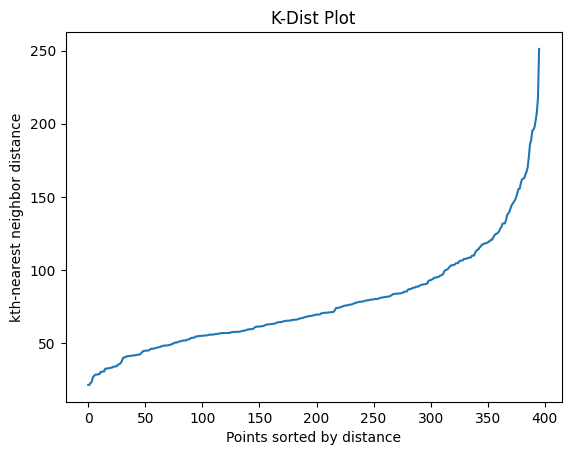

In [ ]:
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(embeddings_solidosv1)
distances, indices = neighbors_fit.kneighbors(embeddings_solidosv1)

# Ordenar e plotar as distâncias
distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances)
plt.title('K-Dist Plot')
plt.xlabel('Points sorted by distance')
plt.ylabel('kth-nearest neighbor distance')
plt.show()

In [ ]:
# Converter a lista de arrays em um array numpy
embeddings_solidosv1 = np.array(embeddings_solidosv1)
embeddings_solidosv1

array([[ 44.385868  ,  24.608347  ,  13.925963  , ...,   7.38391   ,
         -8.273679  , -17.553705  ],
       [ 20.301699  , -26.836195  ,  -6.8432236 , ...,   1.486201  ,
          0.76139116,  -1.2688385 ],
       [ 37.09567   , -23.382597  ,  -8.05455   , ...,  -1.0961751 ,
         -4.4755883 ,   7.7595134 ],
       ...,
       [ 68.79634   ,  -1.8649437 ,  -3.3831663 , ...,   0.809185  ,
         -0.8947518 ,   0.4120011 ],
       [ 49.52811   ,   4.4803767 ,  -1.3946263 , ...,  -0.18021354,
         -2.7274215 ,   1.1228652 ],
       [ 20.891039  , -19.201416  ,   0.32188818, ...,   9.204298  ,
         -6.851435  ,   1.5313987 ]], dtype=float32)

In [ ]:
# Aplicar o DBSCAN
dbscan = DBSCAN(eps=350, min_samples=10)
cluster_labels = dbscan.fit_predict(embeddings_solidosv1)

# Resultados
unique_labels = np.unique(cluster_labels)
print("Labels dos clusters após PCA:", unique_labels)
print("Número de clusters (excluindo outliers) após PCA:", len(unique_labels) - (1 if -1 in unique_labels else 0))
print("Labels dos clusters após PCA:", cluster_labels)

centroids = []
for label in unique_labels:
    if label != -1:  # Ignorando outliers
        # Filtrar os embeddings que pertencem ao cluster atual
        points_in_cluster = embeddings_solidosv1[cluster_labels == label]
        centroid = np.mean(points_in_cluster, axis=0)
        centroids.append(centroid)

# Converter os centróides em um array numpy
centroidsCilindro = np.array(centroids)

print("Centróides:", centroidsCilindro)

Labels dos clusters após PCA: [0]
Número de clusters (excluindo outliers) após PCA: 1
Labels dos clusters após PCA: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Centróides: [[ 4.58577385e+01 -4.20176077e+00 -5.65481782e-01  2.47144175e+00
  

In [ ]:
centroidsCilindro.shape

(1, 400)

In [ ]:
centroidsCilindro

array([[ 4.58577385e+01, -4.20176077e+00, -5.65481782e-01,
         2.47144175e+00, -8.82945299e-01,  1.94253123e+00,
        -1.38084483e+00,  5.29058158e-01,  1.92980444e+00,
        -2.95978618e+00,  4.38333720e-01,  2.05322132e-01,
         5.77811956e-01, -1.67752802e+00, -1.90153599e+00,
        -8.29921842e-01, -2.24446639e-01,  3.01365376e-01,
         9.39050078e-01,  1.21224940e+00,  1.88012674e-01,
        -5.75227626e-02,  7.50700533e-01, -8.92035961e-02,
         3.98167044e-01, -5.72960258e-01,  3.45436573e-01,
         1.07114919e-01,  6.21771336e-01, -9.19104666e-02,
        -5.34698665e-01,  2.93490261e-01, -1.24841653e-01,
         3.88042718e-01, -3.82815659e-01, -3.90219199e-03,
         1.03104614e-01, -2.96001703e-01,  1.50588736e-01,
        -2.25643903e-01, -6.26878289e-04,  1.59178898e-01,
        -1.88866660e-01, -3.47107977e-01, -4.47092742e-01,
        -2.98088104e-01, -7.71121085e-02, -5.36578953e-01,
         4.22892779e-01,  4.12000209e-01,  8.11526775e-0

###Análise Comparativa das bases de dados (similaridade do Cosseno)

#### Distância Euclidiana

In [ ]:
imagenet = [elemento for elemento in dataset_final if elemento.get('dataset') == 'imagenet']
embeddings_imagenet = [elemento['reduced_embeddings'] for elemento in imagenet]
embeddings_imagenet

[array([-3.04114838e+01, -8.66763496e+00,  2.07308912e+00,  5.97564161e-01,
         3.11859274e+00, -9.88357604e-01, -4.02466744e-01, -1.46857810e+00,
        -1.05699434e+01,  9.11459637e+00, -2.51836467e+00, -6.13129663e+00,
        -6.50606871e-01,  4.21185923e+00, -3.33364874e-01,  1.93060994e+00,
         1.12493324e+00,  1.12017605e-03, -3.11768007e+00, -5.22459841e+00,
         1.08213615e+00, -3.21742797e+00,  4.73810673e+00,  6.51970720e+00,
        -2.97424603e+00,  3.70834041e+00, -3.42033553e+00, -7.86315966e+00,
         4.19093800e+00,  5.45525503e+00, -4.71272409e-01, -1.59549534e+00,
         6.72132397e+00, -8.44103050e+00, -5.14265776e+00, -4.52784204e+00,
        -1.54086804e+00, -8.58022213e+00,  4.11309910e+00, -3.39204168e+00,
         2.31027341e+00, -4.45257604e-01, -2.73263049e+00,  3.13781190e+00,
        -2.72032559e-01, -1.19337869e+00, -1.44698572e+00,  6.10813761e+00,
         1.35110128e+00,  1.81715870e+00, -8.26543093e-01, -3.98794818e+00,
         3.1

In [ ]:
type(embeddings_imagenet[1])

numpy.ndarray

In [ ]:
type(centroidsCilindro)

numpy.ndarray

In [ ]:
embeddings_imagenet = np.vstack(embeddings_imagenet)
embeddings_imagenet.shape

(505, 400)

In [ ]:
centroidsCilindro.shape

(1, 400)

In [ ]:
from sklearn.metrics.pairwise import euclidean_distances

distancias = euclidean_distances(centroidsCilindro, embeddings_imagenet)
distancias = distancias[0]

# Exibir as distâncias
print("Distâncias euclidianas:", distancias)
#for index, distancia in enumerate(distancias):
#    print("Índice da imagem:", index, "Distância:", distancia)

max_distancia = distancias.max()
max_index = distancias.argmax()
min_distancia = distancias.min()
min_index = distancias.argmin()
media_distancias = distancias.mean()

# Exibir os resultados
print("Maior distância euclidiana:", max_distancia, "Index da imagem:", max_index)
print("Menor distância euclidiana:", min_distancia, "Index da imagem:", min_index)
print("Média das distâncias euclidianas:", media_distancias)

Distâncias euclidianas: [187.1388   165.23825  215.02742  238.58139  264.55966  162.99554
 255.60947  373.17252   93.63168  343.31805  137.95116   92.15179
 189.77634  212.82097  240.40782  240.57368  423.37436  179.37437
 331.26343  270.9186   367.1225    96.29064  194.81442  258.95844
 183.47935  106.009605 293.26318  296.85782  266.9383   433.426
 132.73247  229.7888   169.38658  288.5239   280.39313  229.88028
 282.49567   87.33133  199.21655  181.49416  305.35458  312.5237
 152.14615  240.05106  137.24947  171.74507  275.1905   170.08098
 202.41484  232.9843   157.0289   112.18212  133.13936  212.421
 132.13069  142.09383  246.53377  210.72957  214.56918  374.33414
 121.55025  287.55524  201.31477  352.58505  113.05481   82.80124
 283.99197  186.90063  102.47419  121.93387  167.64339  155.7014
 262.96756  190.03848  299.41843  316.3812    83.47316  212.81004
 157.12512  126.12925  146.42537  133.65656  128.65758  310.44162
 201.57004  149.69157  330.37057  107.050125 560.26245  19

Comparar as imagens da imagem de maior distância com a de menor distância

In [ ]:
distancias.shape

(505,)

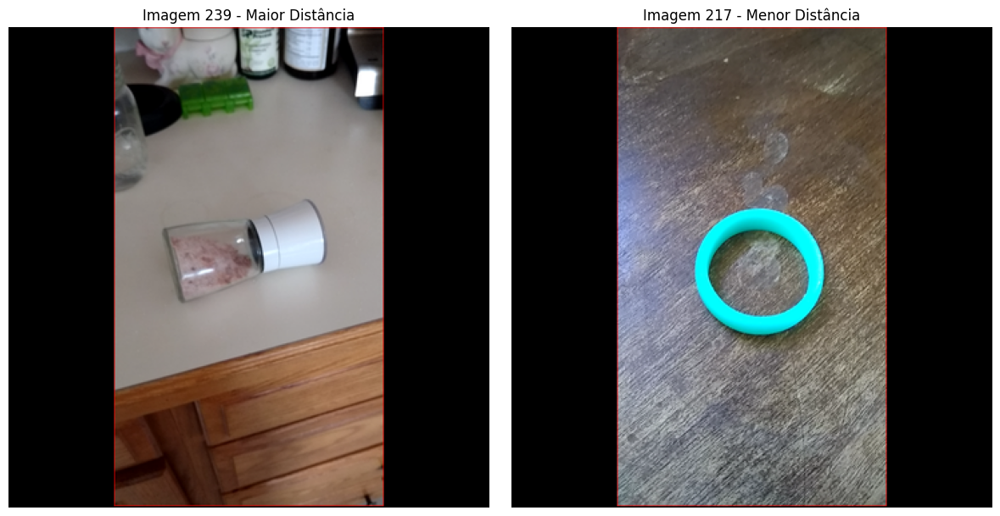

In [ ]:
# Caminho para a pasta que contém as imagens
imagens = "/content/train/Cilindro"

# Criar o mapeamento
file_mapping = {index: filename for index, filename in enumerate(os.listdir(imagens))}

# Índices das imagens com maior e menor distância
image_index_max = 239
image_index_min = 217

# Obter os nomes dos arquivos com base no mapeamento
image_name_max = file_mapping.get(image_index_max)
image_name_min = file_mapping.get(image_index_min)

if image_name_max and image_name_min:
    # Construir o caminho completo para as imagens
    image_path_max = os.path.join(imagens, image_name_max)
    image_path_min = os.path.join(imagens, image_name_min)

    # Carregar as imagens usando PIL
    image_max = Image.open(image_path_max)
    image_min = Image.open(image_path_min)

    # Plotar as imagens lado a lado
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(image_max)
    axs[0].axis('off')
    axs[0].set_title(f"Imagem {image_index_max} - Maior Distância")

    axs[1].imshow(image_min)
    axs[1].axis('off')
    axs[1].set_title(f"Imagem {image_index_min} - Menor Distância")

    plt.tight_layout()
    plt.show()
else:
    print("Um ou ambos os arquivos não foram encontrados.")

In [ ]:
# Obter os índices das cinco maiores distâncias
indices_maior_distancia = np.argsort(-distancias)[:5]
maiores_distancias = distancias[indices_maior_distancia]

# Obter os índices das cinco menores distâncias
indices_menor_distancia = np.argsort(distancias)[:5]
menores_distancias = distancias[indices_menor_distancia]

# Exibir os resultados
print("Índices das 5 maiores distâncias:", indices_maior_distancia, "Distâncias:", maiores_distancias)
print("Índices das 5 menores distâncias:", indices_menor_distancia, "Distâncias:", menores_distancias)

Índices das 5 maiores distâncias: [239  88 214 160 335] Distâncias: [617.32715 560.26245 456.32095 436.97635 433.50882]
Índices das 5 menores distâncias: [217 290  65 490  76] Distâncias: [76.68194  82.665146 82.80124  82.998695 83.47316 ]


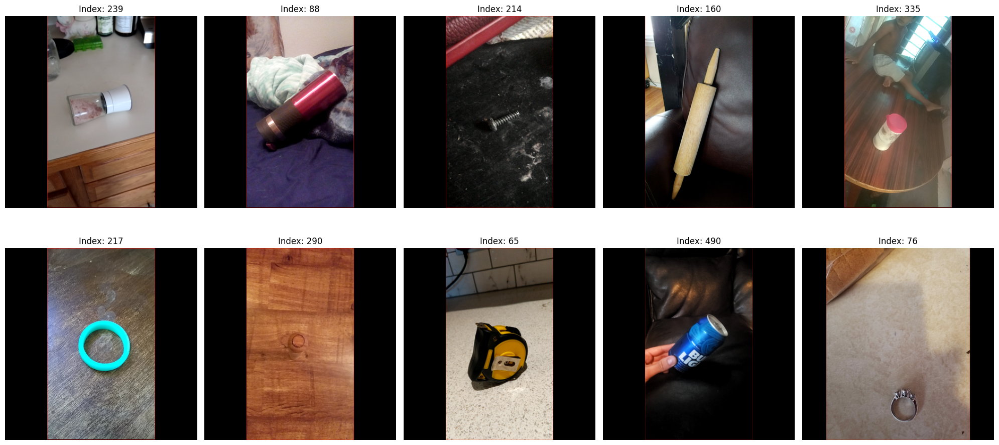

In [ ]:
from PIL import Image
import os
import matplotlib.pyplot as plt

# Caminho para a pasta que contém as imagens
imagens = "/content/train/Cilindro"

# Criar o mapeamento
file_mapping = {index: filename for index, filename in enumerate(os.listdir(imagens))}

# Lista de índices das imagens
indices = [239, 88, 214, 160, 335, 217, 290, 65, 490, 76]

# Lista para armazenar as imagens carregadas
loaded_images = []

# Carregar as imagens usando PIL
for index in indices:
    image_name = file_mapping.get(index)
    if image_name:
        image_path = os.path.join(imagens, image_name)
        try:
            image = Image.open(image_path)
            loaded_images.append((image, index))
        except FileNotFoundError:
            print(f"Arquivo não encontrado: {image_path}")
            loaded_images.append((None, index))  # Adicionar um placeholder se a imagem não for encontrada

# Verificar se as imagens foram carregadas
if any(img for img, _ in loaded_images):
    # Plotar as imagens em duas linhas de cinco colunas
    fig, axs = plt.subplots(2, 5, figsize=(20, 10))  # Ajuste o tamanho conforme necessário
    for ax, (img, idx) in zip(axs.ravel(), loaded_images):
        if img is not None:
            ax.imshow(img)
            ax.set_title(f"Index: {idx}")
        ax.axis('off')  # Esconder os eixos
    plt.tight_layout()
    plt.show()
else:
    print("Nenhuma imagem foi carregada. Verifique os índices e o mapeamento de arquivos.")


#### Similaridade de Cossenos

Filtrando os embeddings do ImageNet

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
#embeddings_imagenet_test = np.array(embeddings_imagenet)

In [ ]:
similaridades = cosine_similarity(centroidsCilindro, embeddings_imagenet)

In [ ]:
maior_valor = np.max(similaridades)
indice = np.argmax(similaridades)
indice

392

In [ ]:
similaridades = similaridades[0]
print(similaridades)

[-0.17644282 -0.2422906  -0.21054664 -0.16441193 -0.14509833 -0.2631042
 -0.15446715 -0.1627096  -0.38728297 -0.16247113 -0.30398923 -0.44079623
 -0.17935441 -0.19877963 -0.14303696 -0.1317099  -0.13510825 -0.21352197
 -0.16564217 -0.15782718 -0.14468016 -0.49468055 -0.20661694 -0.16309017
 -0.19386601 -0.41252124 -0.18618646 -0.18797362 -0.19573079 -0.10884177
 -0.26510754 -0.16821694 -0.28740355 -0.06076949 -0.1912831  -0.20137319
 -0.16458891 -0.5038919  -0.19723114 -0.1734295  -0.1617252  -0.07525605
 -0.23281966 -0.20558278 -0.2614855  -0.26761523 -0.18055862 -0.21607599
 -0.18204466 -0.15999725 -0.2332003  -0.09519543 -0.32364357 -0.16445768
 -0.23239909 -0.30366397 -0.16575085 -0.19148824 -0.17524587 -0.15767418
 -0.3447056  -0.14670356 -0.20426713 -0.11019064 -0.38391575 -0.2753998
 -0.137257   -0.23100513 -0.3509409  -0.30091038 -0.18487467 -0.19875616
 -0.20253465 -0.22341481 -0.13705392 -0.1597127  -0.52708405 -0.17424285
 -0.12213956 -0.3233335  -0.29119244 -0.16055769 -0.3

Visualizando a imagem de maior similaridade

In [ ]:
imagenet_test = [elemento for elemento in dataset_final if elemento.get('dataset') == 'imagenet']
imagenet_test[391]

{'path': '/content/random images/Cópia de 9386889906038987.jpg',
 'dataset': 'imagenet',
 'vgg_feature': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0627, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
          [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.4804, 0.0000, 0.0000],
           ...,
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
          [[0.7080, 0.6695, 0.0000,  ..., 1.4229, 1.21

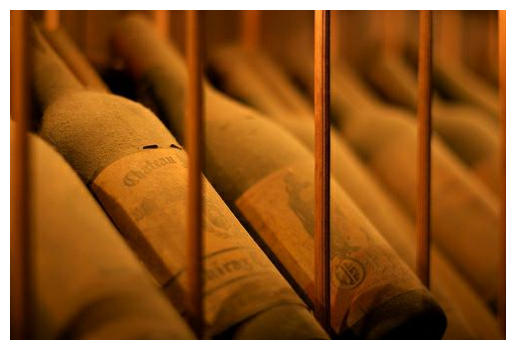

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

caminho_imagem = '/content/random images/Cópia de 9386889906038987.jpg'
imagem = Image.open(caminho_imagem)
plt.imshow(imagem)
plt.axis('off')
plt.show()